<a id="1."></a>
### Importing Libraries

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
import plotly.graph_objects as go


from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import StratifiedKFold

In [2]:
from sklearn.model_selection import train_test_split

<a id="2."></a>
### Data Description

<a id="2.1"></a>
#### Data Loading

In [3]:
df = pd.read_csv("autos.csv")
df.head()

,index,dateCrawled,name,seller,offerType,price,abtest,vehicleType,yearOfRegistration,gearbox,...,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage,dateCreated,nrOfPictures,postalCode,lastSeen
0,0,2016-03-24 11:52:17,Golf_3_1.6,privat,Angebot,480,test,NaN,1993,manuell,...,golf,150000,0,benzin,volkswagen,NaN,2016-03-24 00:00:00,0,70435,2016-04-07 03:16:57
1,1,2016-03-24 10:58:45,A5_Sportback_2.7_Tdi,privat,Angebot,18300,test,coupe,2011,manuell,...,NaN,125000,5,diesel,audi,ja,2016-03-24 00:00:00,0,66954,2016-04-07 01:46:50
2,2,2016-03-14 12:52:21,"Jeep_Grand_Cherokee_""Overland""",privat,Angebot,9800,test,suv,2004,automatik,...,grand,125000,8,diesel,jeep,NaN,2016-03-14 00:00:00,0,90480,2016-04-05 12:47:46
3,3,2016-03-17 16:54:04,GOLF_4_1_4__3TÜRER,privat,Angebot,1500,test,kleinwagen,2001,manuell,...,golf,150000,6,benzin,volkswagen,nein,2016-03-17 00:00:00,0,91074,2016-03-17 17:40:17
4,4,2016-03-31 17:25:20,Skoda_Fabia_1.4_TDI_PD_Classic,privat,Angebot,3600,test,kleinwagen,2008,manuell,...,fabia,90000,7,diesel,skoda,nein,2016-03-31 00:00:00,0,60437,2016-04-06 10:17:21


In [4]:
df.shape

(371528, 21)

In [5]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 371528 entries, 0 to 371527
Data columns (total 21 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   index                371528 non-null  int64 
 1   dateCrawled          371528 non-null  object
 2   name                 371528 non-null  object
 3   seller               371528 non-null  object
 4   offerType            371528 non-null  object
 5   price                371528 non-null  int64 
 6   abtest               371528 non-null  object
 7   vehicleType          333659 non-null  object
 8   yearOfRegistration   371528 non-null  int64 
 9   gearbox              351319 non-null  object
 10  powerPS              371528 non-null  int64 
 11  model                351044 non-null  object
 12  kilometer            371528 non-null  int64 
 13  monthOfRegistration  371528 non-null  int64 
 14  fuelType             338142 non-null  object
 15  brand                371528 non-nu

In [6]:
df.describe()

,index,price,yearOfRegistration,powerPS,kilometer,monthOfRegistration,nrOfPictures,postalCode
count,371528.000000,3.715280e+05,371528.000000,371528.000000,371528.000000,371528.000000,371528.0,371528.00000
mean,185763.500000,1.729514e+04,2004.577997,115.549477,125618.688228,5.734445,0.0,50820.66764
std,107251.039743,3.587954e+06,92.866598,192.139578,40112.337051,3.712412,0.0,25799.08247
min,0.000000,0.000000e+00,1000.000000,0.000000,5000.000000,0.000000,0.0,1067.00000
25%,92881.750000,1.150000e+03,1999.000000,70.000000,125000.000000,3.000000,0.0,30459.00000
50%,185763.500000,2.950000e+03,2003.000000,105.000000,150000.000000,6.000000,0.0,49610.00000
75%,278645.250000,7.200000e+03,2008.000000,150.000000,150000.000000,9.000000,0.0,71546.00000
max,371527.000000,2.147484e+09,9999.000000,20000.000000,150000.000000,12.000000,0.0,99998.00000


In [7]:
persentage_of_missing = df.isnull().sum().sort_values(ascending=False) * 100 / len(df)
persentage_of_missing

notRepairedDamage      19.395577
vehicleType            10.192771
fuelType                8.986133
model                   5.513447
gearbox                 5.439429
index                   0.000000
kilometer               0.000000
postalCode              0.000000
nrOfPictures            0.000000
dateCreated             0.000000
brand                   0.000000
monthOfRegistration     0.000000
powerPS                 0.000000
dateCrawled             0.000000
yearOfRegistration      0.000000
abtest                  0.000000
price                   0.000000
offerType               0.000000
seller                  0.000000
name                    0.000000
lastSeen                0.000000
dtype: float64

In [8]:
fig = px.bar(x=persentage_of_missing.index, y=persentage_of_missing, title= "Percentage of Missing Values in Used Car Data", labels={"x" : "Columns", "y" : "Percentage of Missing Values"})
fig.update_traces(marker_color = "red") 
fig.show()

# Replacing missing values in  with most common value

In [9]:
most_common = df["notRepairedDamage"].value_counts(ascending=False).index[0] 
df["notRepairedDamage"].fillna(most_common, inplace=True) 

In [10]:
most_common = df["vehicleType"].value_counts(ascending=False).index[0] 
df["vehicleType"].fillna(most_common, inplace=True) 

In [11]:
most_common = df["fuelType"].value_counts(ascending=False).index[0] 
df["fuelType"].fillna(most_common, inplace=True) 

In [12]:
most_common = df["gearbox"].value_counts(ascending=False).index[0] 
df["gearbox"].fillna(most_common, inplace=True) 

In [13]:
df["model"].fillna("unknown", inplace=True)

In [14]:
df.drop(['lastSeen', 'dateCrawled','dateCreated','nrOfPictures','postalCode'], axis=1, inplace=True)

In [15]:
df.isnull().sum()

index                  0
name                   0
seller                 0
offerType              0
price                  0
abtest                 0
vehicleType            0
yearOfRegistration     0
gearbox                0
powerPS                0
model                  0
kilometer              0
monthOfRegistration    0
fuelType               0
brand                  0
notRepairedDamage      0
dtype: int64

In [16]:
df.head()

,index,name,seller,offerType,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage
0,0,Golf_3_1.6,privat,Angebot,480,test,limousine,1993,manuell,0,golf,150000,0,benzin,volkswagen,nein
1,1,A5_Sportback_2.7_Tdi,privat,Angebot,18300,test,coupe,2011,manuell,190,unknown,125000,5,diesel,audi,ja
2,2,"Jeep_Grand_Cherokee_""Overland""",privat,Angebot,9800,test,suv,2004,automatik,163,grand,125000,8,diesel,jeep,nein
3,3,GOLF_4_1_4__3TÜRER,privat,Angebot,1500,test,kleinwagen,2001,manuell,75,golf,150000,6,benzin,volkswagen,nein
4,4,Skoda_Fabia_1.4_TDI_PD_Classic,privat,Angebot,3600,test,kleinwagen,2008,manuell,69,fabia,90000,7,diesel,skoda,nein


<a id="2.2"></a>
#### name

In [17]:
len(df['brand'].unique())
#We have over 40 unique car names, so we will extract only the car brand from the car names

40

In [18]:
df.drop(['name'], axis = 1, inplace = True)
#we can drop the name column now

In [19]:
df.head()

,index,seller,offerType,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage
0,0,privat,Angebot,480,test,limousine,1993,manuell,0,golf,150000,0,benzin,volkswagen,nein
1,1,privat,Angebot,18300,test,coupe,2011,manuell,190,unknown,125000,5,diesel,audi,ja
2,2,privat,Angebot,9800,test,suv,2004,automatik,163,grand,125000,8,diesel,jeep,nein
3,3,privat,Angebot,1500,test,kleinwagen,2001,manuell,75,golf,150000,6,benzin,volkswagen,nein
4,4,privat,Angebot,3600,test,kleinwagen,2008,manuell,69,fabia,90000,7,diesel,skoda,nein


In [20]:
brand_count = df.groupby('brand').count()['fuelType'].sort_values(ascending = False)
brand_count

brand
volkswagen        79640
bmw               40274
opel              40136
mercedes_benz     35309
audi              32873
ford              25573
renault           17969
peugeot           11027
fiat               9676
seat               7022
mazda              5695
skoda              5641
smart              5249
citroen            5182
nissan             5037
toyota             4694
sonstige_autos     3982
hyundai            3646
mini               3394
volvo              3327
mitsubishi         3061
honda              2836
kia                2555
alfa_romeo         2345
suzuki             2328
porsche            2215
chevrolet          1845
chrysler           1452
dacia               900
jeep                807
daihatsu            806
subaru              779
land_rover          770
jaguar              621
trabant             591
daewoo              542
saab                530
rover               490
lancia              484
lada                225
Name: fuelType, dtype: int64

In [21]:
df=df.dropna()

<a id="2.3"></a>
#### year

In [22]:
df['yearOfRegistration'].value_counts()

2000    24551
1999    22767
2005    22316
2006    20230
2001    20218
        ...  
2066        1
9450        1
3200        1
1925        1
3500        1
Name: yearOfRegistration, Length: 155, dtype: int64

In [23]:
df['yearOfRegistration'] = df['yearOfRegistration'].astype(int)
df['age'] = 2023 - df['yearOfRegistration']

In [24]:
df['notRepairedDamage'] = df['notRepairedDamage'].replace('ja', 'yes')
df['notRepairedDamage'] = df['notRepairedDamage'].replace('nein', 'no')

In [25]:
df['gearbox'] = df['gearbox'].replace('manuell', 'manual')
df['gearbox'] = df['gearbox'].replace('automatik', 'automatic')


In [26]:
df['seller'] = df['seller'].replace('privat', 'private')
df['seller'] = df['seller'].replace('gewerblich', 'commercial')


In [27]:
df['vehicleType'] = df['vehicleType'].replace('limousine', 'Sedan')
df['vehicleType'] = df['vehicleType'].replace('kleinwagen', 'Smallsedan')
df['vehicleType'] = df['vehicleType'].replace('kombi', 'Estatecar')
df['vehicleType'] = df['vehicleType'].replace('cabrio', 'convertible')
df['vehicleType'] = df['vehicleType'].replace('andere', 'other')


In [28]:
df['offerType'] = df['offerType'].replace('Angebot', 'offer')
df['offerType'] = df['offerType'].replace('Gesuch', 'request')



In [29]:
df

,index,seller,offerType,price,abtest,vehicleType,yearOfRegistration,gearbox,powerPS,model,kilometer,monthOfRegistration,fuelType,brand,notRepairedDamage,age
0,0,private,offer,480,test,Sedan,1993,manual,0,golf,150000,0,benzin,volkswagen,no,30
1,1,private,offer,18300,test,coupe,2011,manual,190,unknown,125000,5,diesel,audi,yes,12
2,2,private,offer,9800,test,suv,2004,automatic,163,grand,125000,8,diesel,jeep,no,19
3,3,private,offer,1500,test,Smallsedan,2001,manual,75,golf,150000,6,benzin,volkswagen,no,22
4,4,private,offer,3600,test,Smallsedan,2008,manual,69,fabia,90000,7,diesel,skoda,no,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371523,371523,private,offer,2200,test,Sedan,2005,manual,0,unknown,20000,1,benzin,sonstige_autos,no,18
371524,371524,private,offer,1199,test,convertible,2000,automatic,101,fortwo,125000,3,benzin,smart,no,23
371525,371525,private,offer,9200,test,bus,1996,manual,102,transporter,150000,3,diesel,volkswagen,no,27
371526,371526,private,offer,3400,test,Estatecar,2002,manual,100,golf,150000,6,diesel,volkswagen,no,21


In [30]:
def remove_outliers(df: pd.DataFrame) -> pd.DataFrame:
    Q1 = df.quantile(.1, numeric_only=True) # find the Q1 value for each column with numeric data
    Q3 = df.quantile(.9, numeric_only=True) # find the Q3 value for each column with numeric data
    IQR = Q3 - Q1 # find the interquartile range for each column with numeric data
    
    # return the dataframe with rows that do not have any values lower than Q1 - 1.5 * IQR or higher than Q3 + 1.5 * IQR
    return df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

df = remove_outliers(df)

C:\Users\bhanu\AppData\Local\Temp\ipykernel_11340\3345330717.py:7: FutureWarning:

Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`



<a id="2.4"></a>
#### fuel

In [31]:
df['fuelType'].value_counts()

benzin     252787
diesel     105901
lpg          5354
cng           568
hybrid        262
andere        189
elektro        93
Name: fuelType, dtype: int64

<a id="2.5"></a>
#### owner

In [32]:
df['seller'].value_counts()

private       365152
commercial         2
Name: seller, dtype: int64

<a id="2.7"></a>
#### vehicleType

In [33]:
df['vehicleType'].value_counts()

Sedan          131905
Smallsedan      79822
Estatecar       67020
bus             29824
convertible     21813
coupe           17637
suv             13891
other            3242
Name: vehicleType, dtype: int64

<a id="2.8"></a>
#### price

In [34]:
df['price'].describe().round()


count    365154.0
mean       5128.0
std        5885.0
min           0.0
25%        1100.0
50%        2900.0
75%        6950.0
max       34200.0
Name: price, dtype: float64

In [52]:
# Convert 'price' column to numeric, coercing errors to NaN
df['price'] = pd.to_numeric(df['price'], errors='coerce')


C:\Users\bhanu\AppData\Local\Temp\ipykernel_11340\1300059749.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<a id="2.9"></a>
#### kilometer

In [36]:
df['kilometer'].describe().round()

count    365154.0
mean     126648.0
std       39126.0
min        5000.0
25%      125000.0
50%      150000.0
75%      150000.0
max      150000.0
Name: kilometer, dtype: float64

C:\Users\bhanu\AppData\Local\Temp\ipykernel_11340\2827193860.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



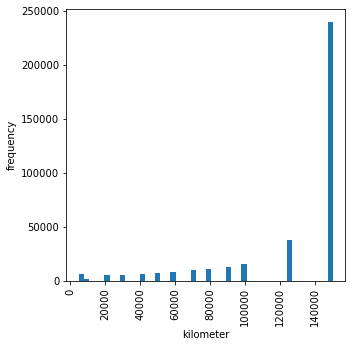

In [54]:


# Convert 'kilometer' column to numeric, coercing errors to NaN
df['kilometer'] = pd.to_numeric(df['kilometer'], errors='coerce')

# Create the histogram after converting 'kilometer' column to numeric
plt.figure(figsize=(5, 5))
plt.hist(df['kilometer'].dropna(), bins=50)
plt.xlabel("kilometer")
plt.ylabel("frequency")
plt.xticks(rotation=90)
plt.show()

<a id="3.2"></a>
#### Correlation Matrix between monthOfRegistration, yearOfRegistration and price

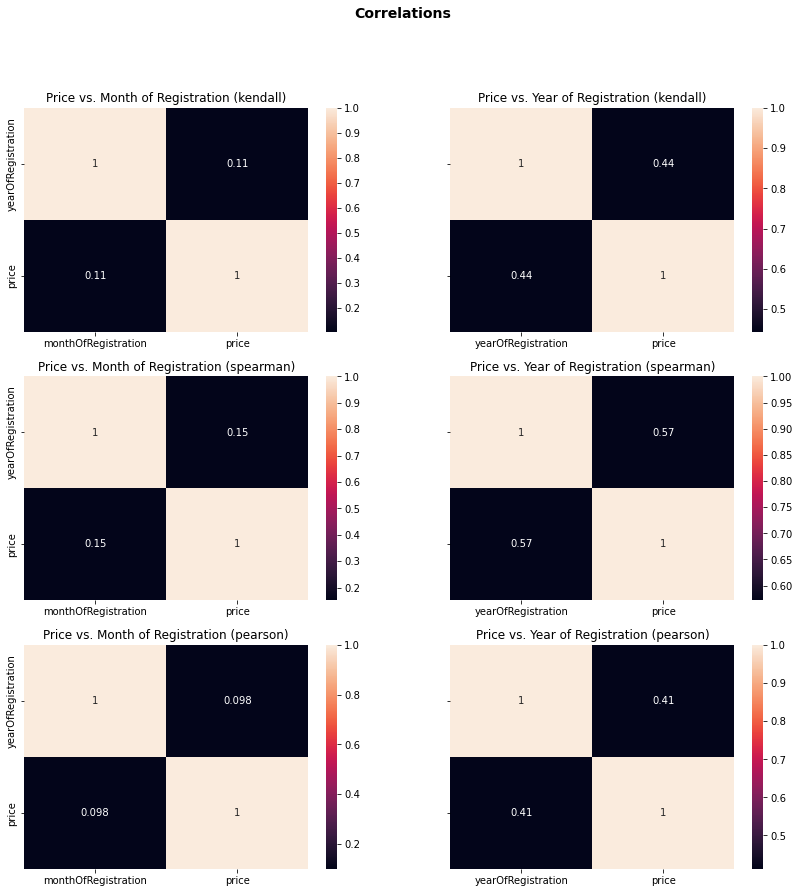

In [39]:
a = df[['monthOfRegistration', 'price']]
b = df[['yearOfRegistration', 'price']]
methods = ['kendall', 'spearman', 'pearson']

fig, axes = plt.subplots(3, 2, figsize=(14, 14), sharey=True)
fig.suptitle('Correlations', fontweight='bold', fontsize='14')

for i in range(3):
        
    sns.heatmap(a.corr(method=methods[i]), annot=True, ax=axes[i,0])
    axes[i,0].set_title(f"Price vs. Month of Registration ({methods[i]})")
    sns.heatmap(b.corr(method=methods[i]), annot=True, ax=axes[i,1])
    axes[i,1].set_title(f"Price vs. Year of Registration ({methods[i]})")

There's no correlation between Price and Month of registration, so we can drop it

In [40]:
df.drop(['monthOfRegistration'], axis=1, inplace=True)

C:\Users\bhanu\AppData\Local\Temp\ipykernel_11340\3930889699.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<a id="3."></a>
### Exploratory Data Analysis

#### Vehicle type vs price

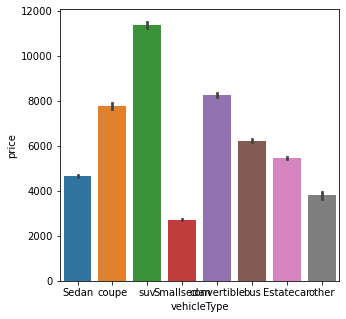

In [41]:
plt.figure(figsize = (5,5))
sns.barplot(x = 'vehicleType', y = 'price', data = df)
plt.show()

Suv cars have higher prices when compared to other cars and followed by convertible cars and coupe cars. Small sedans have relatively lower prices than other cars.

#### Damage repair vs price

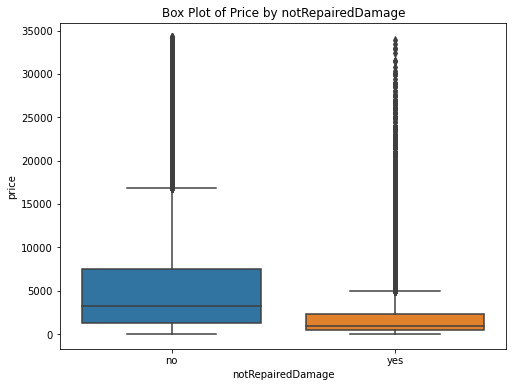

In [42]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='notRepairedDamage', y='price', data=df)
plt.xlabel('notRepairedDamage')
plt.ylabel('price')
plt.title('Box Plot of Price by notRepairedDamage')
plt.show()


The median price of cars with not repaired damage appears to be lower than the median price of cars without not repaired damage. The box for cars with not repaired damage is entirely below the box for cars without not repaired damage.
The distribution of prices for cars with not repaired damage has a wider range than the distribution of prices for cars without not repaired damage. The box for cars with not repaired damage is longer than the box for cars without not repaired damage.
There appear to be more outliers for cars with not repaired damage than for cars without not repaired damage. 

#### kilometers vs price

In [43]:
fig = px.scatter(data_frame=df.iloc[:10000], x = "kilometer", y = "price") # Plot scatter plot of price vs. Kilometer in the clean_user_car dataframe, using the first 10000 rows
fig.show()

The pattern to the data points suggests that the relationship between price and mileage is not perfect. In other words, there are other factors besides mileage that can affect the price of a car.
There appear to be a few data points that fall outside the main cluster of data points. These data points may be outliers, which are data points that differ significantly from the overall trend.

#### Brand vs price

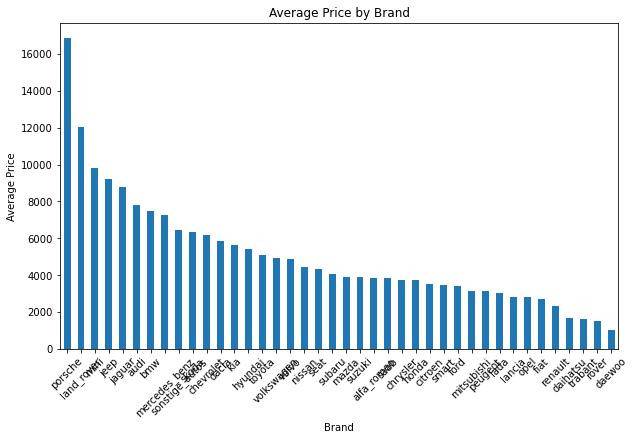

In [50]:
avg_price_per_brand = df.groupby('brand')['price'].mean()

avg_price_per_brand = avg_price_per_brand.sort_values(ascending=False)

plt.figure(figsize=(10,6))
avg_price_per_brand.plot(kind='bar')
plt.xlabel('Brand')
plt.ylabel('Average Price')
plt.title('Average Price by Brand')
plt.xticks(rotation=45)
plt.show()

Porsche brand cars have more price than all other car brands then followed by land rover, jeep, jaguar and audi etc.

#### Gearbox vs price

In [44]:
fig = px.box(data_frame=df, x = "price", color="gearbox")
fig.show()

Based on this plot, it appears that cars with automatic gearboxes tend to be slightly more expensive than cars with manual gearboxes. This can potentially be due to various factors such as the popularity and demand for automatic gearboxes, or perhaps the additional features and technology that may come with cars equipped with automatic gearboxes


#### age vs price

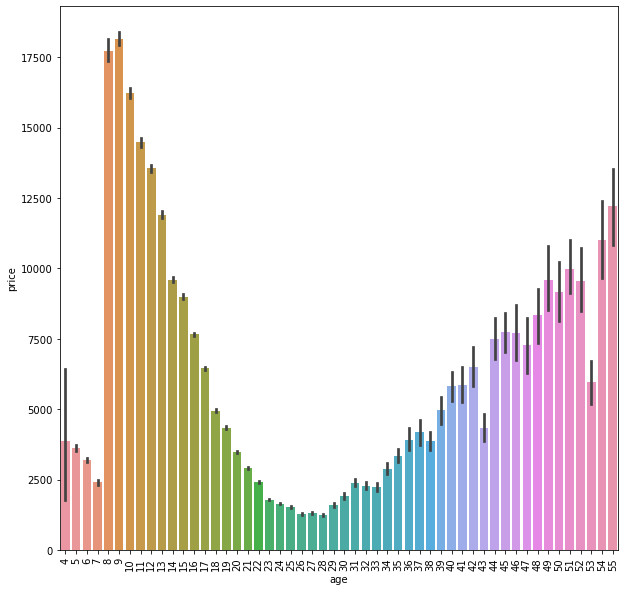

In [45]:
plt.figure(figsize = (10,10))
sns.barplot(x = 'age', y = 'price', data = df)
plt.xticks(rotation = 90)
plt.show()

We can see that there is no standard pattern between age and price. Some cars with less age have higher prices and middle aged cars have lower prices and some cars with higher age also have higher prices. So we can say that price doesn't solely depends on price.There are other factors besides age that can affect the price of a car.


#### fueltype vs price

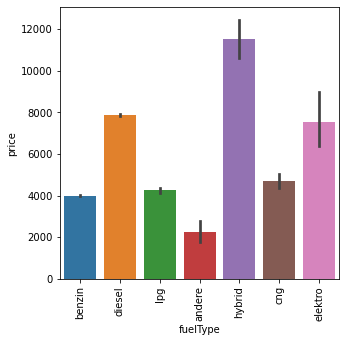

In [46]:
plt.figure(figsize = (5,5))
sns.barplot(x = 'fuelType', y = 'price', data = df)
plt.xticks(rotation = 90)
plt.show()

Cars with hybrid fuel type have higher price and then followed by diesel and electric. LPG, CNG, benzin all these fueltype cars have almost same prices.


#### seller vs price

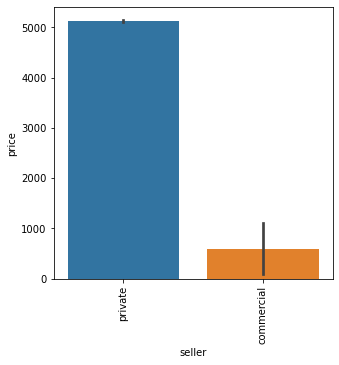

In [47]:
plt.figure(figsize = (5,5))
sns.barplot(x = 'seller', y = 'price', data = df)
plt.xticks(rotation = 90)
plt.show()

#### Correlations between variables in the dataset

In [51]:
cat_cols = ["notRepairedDamage", "vehicleType",
            "abtest", "gearbox", "model", "fuelType", "brand"] # Initialize a list of categorical column names

encoder = LabelEncoder() # Initialize a LabelEncoder object
encoded_car = df.copy() # Make a copy of the clean_user_car dataframe and assign it to encoded_user_car
encoded_car[cat_cols] = encoded_car[cat_cols].apply(encoder.fit_transform)
corr = encoded_car.corr() # Calculate the correlation matrix of the encoded_user_car dataframe
fig = go.Figure() # Initialize a Figure object from the plotly library
fig.add_trace(
    go.Heatmap(
        x = corr.index,
        y = corr.index,
        z = corr,
        text=corr.values,
        texttemplate='%{text:.2f}'
    )
) 
fig.update_layout(width = 1000, height = 1000, title = "Heatmap showing correlations between variables in the used car dataset") # Update the layout of the figure to set the width and height
fig.show()

#### Top 10 and bottom 10 brands ads count

<AxesSubplot:title={'center':'Bottom 10 Brands - Ads Count'}, xlabel='Brand', ylabel='Count'>

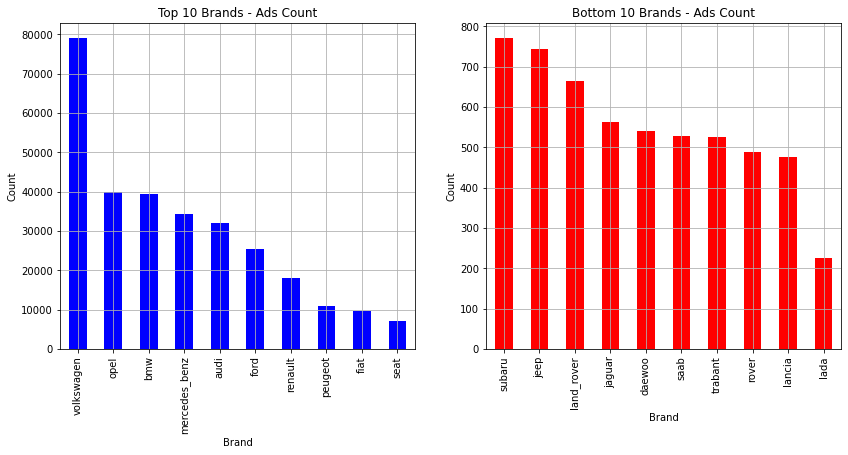

In [48]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

df['brand'].value_counts().head(10).plot(kind='bar', title='Top 10 Brands - Ads Count', color='blue', ax=axes[0], xlabel='Brand', ylabel='Count', grid=True)
df['brand'].value_counts().tail(10).plot(kind='bar', title='Bottom 10 Brands - Ads Count', color='red', ax=axes[1], xlabel='Brand', ylabel='Count', grid=True)

#### Top 10 Cars by Vehicle Type, Brand, and Model - Ads Count

<AxesSubplot:title={'center':'Top 10 Cars by Vehicle Type, Brand, and Model - Ads Count'}, xlabel='vehicleType,model,brand'>

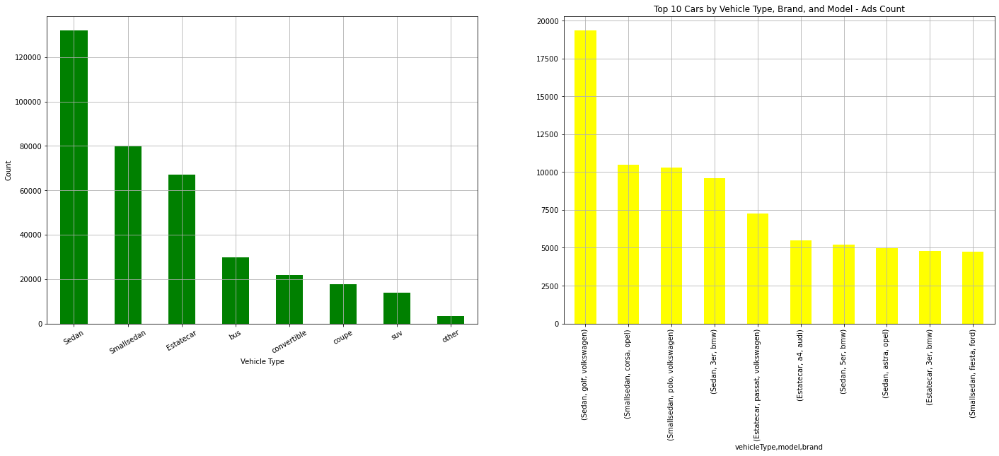

In [49]:
group_by_vehicle_type = df.groupby('vehicleType')[['model', 'brand']].value_counts().sort_values(ascending=False)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(24, 8))

df['vehicleType'].value_counts().plot(kind='bar', color='green', ax=axes[0], grid=True, rot=30, xlabel='Vehicle Type', ylabel='Count', title='')
group_by_vehicle_type.head(10).plot(kind='bar', grid=True, color='yellow', ax=axes[1], title='Top 10 Cars by Vehicle Type, Brand, and Model - Ads Count')